In [1]:
import os
import cv2
import numpy as np
import albumentations as A
import random
from matplotlib import pyplot as plt

In [2]:
def plot_images(img1, img2):
    plt.figure(figsize=(20,10))
    ax1 = plt.subplot(121)
    ax1.imshow(img1)
    ax2 = plt.subplot(122)
    ax2.imshow(img2)
    plt.show()

def plot_img(img):
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.show()

## Augment

In [3]:
augment = A.Compose([
            A.Affine(scale=(1.15), keep_ratio=True,
                     shear=[-5, 5], interpolation=cv2.INTER_CUBIC, mode=cv2.BORDER_CONSTANT, p=0.5),
            A.OneOf([
                # A.HorizontalFlip(p=1),
                # A.VerticalFlip(p=1),
                A.Flip(p=1),
                # A.Rotate(p=1),
            ], p=1),
            A.OneOf([
                A.RandomBrightnessContrast(
                    brightness_limit=0.1, contrast_limit=0.2, p=1),
                A.RandomGamma(gamma_limit=(60, 140), p=1),
            ], p=1),
            A.OneOf([
                A.ElasticTransform(alpha=500, sigma=50, alpha_affine=10,
                                   interpolation=cv2.INTER_CUBIC, border_mode=cv2.BORDER_CONSTANT, p=1),
                A.GridDistortion(num_steps=20, distort_limit=0.05,
                                 interpolation=cv2.INTER_CUBIC, border_mode=cv2.BORDER_CONSTANT, p=1),
                A.NoOp(p=1)
            ], p=1),
            A.Compose([
                A.CenterCrop(height=HIGH_RES-20, width=HIGH_RES-20, p=1),
                A.Resize(height=HIGH_RES, width=HIGH_RES,
                         interpolation=cv2.INTER_CUBIC, p=1),
            ], p=1),
        ], p=1)

In [48]:
HIGH_RES = 1024
transform = A.Compose([
            A.Affine(scale=(1.15), keep_ratio=True, shear=[-5,5], interpolation=cv2.INTER_CUBIC, mode=cv2.BORDER_CONSTANT, p=0.5),
            A.OneOf([
                # A.HorizontalFlip(p=1),
                # A.VerticalFlip(p=1),
                # A.RandomRotate90(p=1),
            ], p=1),
            A.OneOf([
                # A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=1),
                # A.RandomGamma(gamma_limit=(60,140), p=1),
            ], p=1),
            A.OneOf([
                A.ElasticTransform(alpha=500, sigma=50, alpha_affine=20,
                                   interpolation=cv2.INTER_CUBIC, border_mode=cv2.BORDER_CONSTANT, p=1),
                A.GridDistortion(num_steps=20, distort_limit=0.05,
                                 interpolation=cv2.INTER_CUBIC, border_mode=cv2.BORDER_CONSTANT, p=1),
                # A.NoOp(p=1)
            ], p=1),
            A.Compose([
                A.CenterCrop(height=HIGH_RES-30, width=HIGH_RES-30, p=1),
                A.Resize(height=HIGH_RES, width=HIGH_RES,
                         interpolation=cv2.INTER_CUBIC, p=1),
            ], p=1),
        ])

ISIC_0061588.png


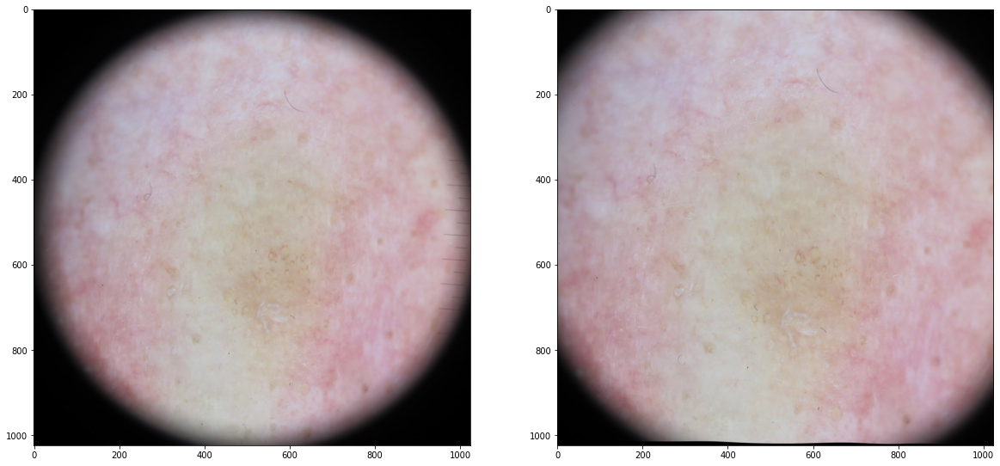

In [52]:
# --------- Augment
path = "D:\\DOMI\\University\\Magistrale\\Tesi\\Pipeline_coding\\dataset_noArtifact_sliding\\AKIEC"
pathToSave = "D:\\DOMI\\University\\Magistrale\\Tesi\\Pipeline_coding\\lowSave_try\\"
images = os.listdir(path)
rnd = random.randint(0, len(images))
for image_name in images[rnd:rnd+1]:
    image_name = random.choice(images)
print(image_name)
# image_name = "ISIC_0065421.png"
image = cv2.imread(os.path.join(path, image_name))
augmented_image = transform(image=image)['image']

# new_img_filename = os.path.join(pathToSave, image_name)
# plot_img(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB))
plot_images(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB))
# plot_img(cv2.cvtColor(augmented_image, cv2.COLOR_BG R2RGB))

## Paired

In [3]:
class Augmentation:
    def __init__(self, image):
        self.image = image

    def augment(self):
        transform = A.Compose([
            A.Affine(scale=1.2, keep_ratio=True, shear=[-3,3], interpolation=cv2.INTER_CUBIC, mode=cv2.BORDER_CONSTANT, p=1),
            A.OneOf([
                A.Flip(p=1),
                A.RandomRotate90(p=1),
            ], p=1),
            A.OneOf([
                A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.3, p=1),
                A.RandomGamma(gamma_limit=(50,150), p=1),
            ]),
            A.OneOf([
                A.ElasticTransform(alpha=1000, sigma=50, alpha_affine=10, interpolation=cv2.INTER_CUBIC, border_mode=cv2.BORDER_CONSTANT, p=1),
                A.GridDistortion(num_steps=20, distort_limit=0.05, interpolation=cv2.INTER_CUBIC, border_mode=cv2.BORDER_CONSTANT, p=1),
                A.NoOp(p=1)
            ],p=1)
        ])
        return transform(image=self.image)['image']


class Paired:
    def __init__(self, image):
        self.image = image

    def lowres_1order(self, scale):
        lowres_1st = A.Compose([
            #-----Blur
            A.OneOf([
                A.GaussianBlur(blur_limit=(7,21), sigma_limit=(0.2,3), p=0.7),
                A.AdvancedBlur(blur_limit=(7,21), sigmaX_limit=(0.2,3), sigmaY_limit=(0.2,3), beta_limit=(0.5,4), p=0.15),
                A.RingingOvershoot(blur_limit=(7,21), p=0.1)
                ], p=1),
            #-----Downscale
            A.OneOf([
                # A.Downscale(scale_min=1/LOW_SCALE, scale_max=1/LOW_SCALE, interpolation=cv2.INTER_NEAREST, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_LINEAR, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_AREA, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_CUBIC, p=1),
                ], p=1),
            #-----Noise
            A.OneOf([
                A.GaussNoise(var_limit=(1,30), p=0.5),
                A.GaussNoise(var_limit=(1,30), per_channel=False, p=0.4),
                A.ISONoise(intensity=(0.05,0.5), p=0.5),
                ], p=1),
            #-----Compression
            A.ImageCompression(quality_lower=30, quality_upper=95, p=1)
        ])
        return lowres_1st(image=self.image)['image']
        
    def lowres_2order(self, scale):    
        lowres_1st_2nd = A.Compose([
            #-----Blur
            A.OneOf([
                A.GaussianBlur(blur_limit=(7,21), sigma_limit=(0.2,3), p=0.7),
                A.AdvancedBlur(blur_limit=(7,21), sigmaX_limit=(0.2,3), sigmaY_limit=(0.2,3), beta_limit=(0.5,4), p=0.15),
                A.RingingOvershoot(blur_limit=(7,21), p=0.1)
                ], p=1),
            #-----Downscale
            A.OneOf([
                # A.Downscale(scale_min=1/LOW_SCALE, scale_max=1/LOW_SCALE, interpolation=cv2.INTER_NEAREST, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_LINEAR, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_AREA, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_CUBIC, p=1),
                ], p=1),
            #-----Noise
            A.OneOf([
                A.GaussNoise(var_limit=(1,30), p=0.5),
                A.GaussNoise(var_limit=(1,30), per_channel=False, p=0.4),
                A.ISONoise(intensity=(0.05,0.5), p=0.5),
                ], p=1),
            #-----Compression
            A.ImageCompression(quality_lower=30, quality_upper=95, p=1),

            ########## 2ND ORDER ##########
            #-----Blur
            A.OneOf([
                A.GaussianBlur(blur_limit=(7,21), sigma_limit=(0.2,3), p=0.7),
                A.AdvancedBlur(blur_limit=(7,21), sigmaX_limit=(0.2,3), sigmaY_limit=(0.2,3), beta_limit=(0.5,4), p=0.15),
                A.RingingOvershoot(blur_limit=(7,21), p=0.1)
                ], p=0.2),
            #-----Downscale     
            A.OneOf([
                # A.Downscale(scale_min=1/LOW_SCALE, scale_max=1/LOW_SCALE, interpolation=cv2.INTER_NEAREST, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_LINEAR, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_AREA, p=1),
                A.Downscale(scale_min=1/scale, scale_max=1/scale, interpolation=cv2.INTER_CUBIC, p=1),
                ], p=1),
            #-----Noise
            A.OneOf([
                A.GaussNoise(var_limit=(1,25), p=0.5),
                A.GaussNoise(var_limit=(1,30), per_channel=False, p=0.4),
                A.ISONoise(intensity=(0.05,0.1), p=0.5)
                ], p=1),
            #-----Compression
            A.OneOf([
                A.Compose([
                    A.ImageCompression(quality_lower=30, quality_upper=95, p=1),
                    A.RingingOvershoot(blur_limit=(7,21), p=0.8)
                    ]),
                A.Compose([
                    A.RingingOvershoot(blur_limit=(7,21), p=0.8),
                    A.ImageCompression(quality_lower=30, quality_upper=95, p=1)
                    ])
                ], p=1)
        ])
        return lowres_1st_2nd(image=self.image)['image']

    def highres_sharp(self):
        highres = A.Compose([
        A.Sharpen(alpha=(0.5, 0.5), lightness=(1, 1), p=1),
        A.MedianBlur(blur_limit=(3,3), p=0.8)
        ])
        return highres(image=self.image)['image']


ISIC_0055686.png


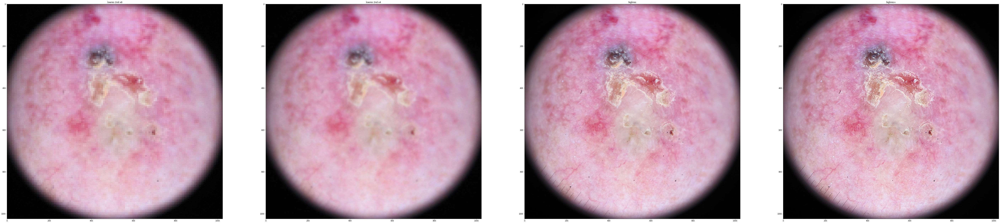

ISIC_0062830.png


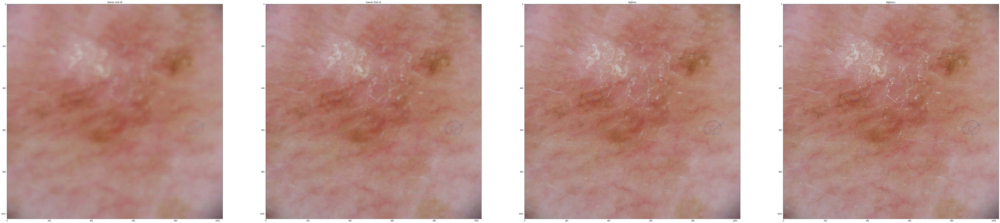

ISIC_0066825.png


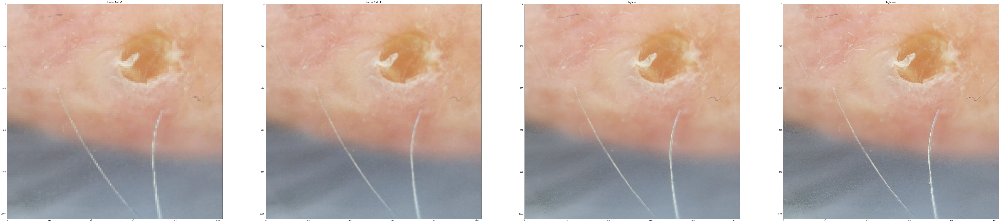

In [6]:
path = "D:\\DOMI\\University\\Magistrale\\Tesi\\Pipeline_coding\\dataset_noArtifact\\AKIEC"
pathToSave = "D:\\DOMI\\University\\Magistrale\\Tesi\\Pipeline_coding\\lowSave_try\\"

images = os.listdir(path)
rnd = random.randint(0, len(images))
imgs_toPlot = []
path_plot = "D:\\DOMI\\University\\Magistrale\\Tesi\\Pipeline_coding\\graphics_paired_compare"

for idx,image_name in enumerate(images[rnd:rnd+3]):
    image_name = random.choice(images)
    print(image_name)
# image_name = "ISIC_0063845.png"

    image = cv2.imread(os.path.join(path, image_name))

    # augmentation = Augmentation(image)
    # augmented_image = augmentation.augment()

    paired = Paired(image)

    lowres_image_1st_x4 = paired.lowres_1order(scale=4)
    lowres_image_1st_x8 = paired.lowres_1order(scale=8)

    lowres_image_2nd_x4 = paired.lowres_2order(scale=4)
    lowres_image_2nd_x8 = paired.lowres_2order(scale=8)

    highres_sharpen_image = paired.highres_sharp()

    imgs_toPlot += [lowres_image_2nd_x8,lowres_image_2nd_x4,image,highres_sharpen_image]

    # imgs_toPlot += [lowres_image_2nd_x8, lowres_image_2nd_x4, image, highres_sharpen_image]
    fig = plt.figure(figsize=(100,100))
    ax1 = plt.subplot(1,4,1)
    ax1.imshow(cv2.cvtColor(lowres_image_2nd_x8, cv2.COLOR_BGR2RGB)), ax1.set_title('lowres 2nd x8')
    ax2 = plt.subplot(1,4,2)
    ax2.imshow(cv2.cvtColor(lowres_image_2nd_x4, cv2.COLOR_BGR2RGB)), ax2.set_title('lowres 2nd x4')
    ax3 = plt.subplot(1,4,3)
    ax3.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), ax3.set_title('highres')
    ax4 = plt.subplot(1,4,4)
    ax4.imshow(cv2.cvtColor(highres_sharpen_image, cv2.COLOR_BGR2RGB)), ax4.set_title("highres+")
    plt.show()

    # fig.savefig(os.path.join(path_plot,image_name))

    # plt.figure(figsize=(40,40))
    # ax1 = plt.subplot(221)
    # ax1.imshow(cv2.cvtColor(lowres_image_2nd_x8, cv2.COLOR_BGR2RGB)), ax1.set_title('lowres 2nd x8')
    # ax2 = plt.subplot(222)
    # ax2.imshow(cv2.cvtColor(lowres_image_2nd_x4, cv2.COLOR_BGR2RGB)), ax2.set_title('lowres 2nd x4')
    # ax3 = plt.subplot(223)
    # ax3.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), ax3.set_title('highres')
    # ax4 = plt.subplot(224)
    # ax4.imshow(cv2.cvtColor(highres_sharpen_image, cv2.COLOR_BGR2RGB)), ax4.set_title("highres+")
    # plt.show()

